# 모듈 import

In [49]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import cv2

from tqdm import tqdm
import os

In [50]:
# 버전 확인
print(cv2.__version__)

4.5.1


In [51]:
# 코드로 zip 압축 풀기
# !unzip -uq './sample_data.zip' -d './sample_data'

In [52]:
# 데이터 불러오기 -> 추후 이 코드 활용해서 pk값 및 분류 레이블 가져오면 될긋
# df = pd.read_csv('./whale/train.csv')
# df.head()

In [53]:
# 파일명 불러오기 (아래 코드 사용하기 위함)
path_dir = './sample_data'
file_list = os.listdir(path_dir) # 파일 전부 불러와서 리스트로 반환
file_list.sort()
file_list

['img_00.jpeg',
 'img_01.jpeg',
 'img_02.jpeg',
 'img_03.jpeg',
 'img_04.jpeg',
 'img_05.jpeg',
 'img_06.jpeg',
 'img_07.jpeg',
 'img_08.jpeg',
 'img_09.jpeg',
 'img_10.jpeg',
 'img_11.jpeg',
 'img_12.jpeg',
 'img_13.jpeg',
 'img_14.jpeg']

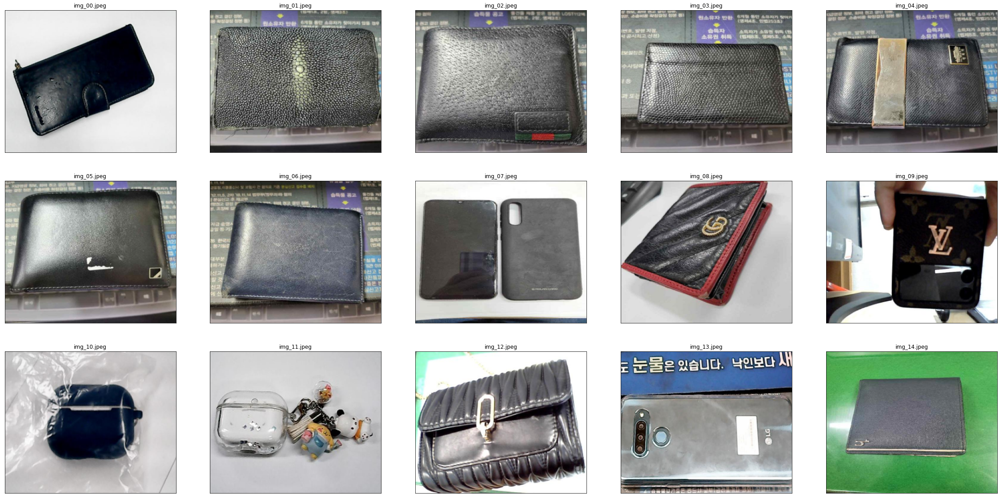

In [54]:
def load(path, size=128):
    img= cv2.resize(cv2.imread(path),(size,size))
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def show():
    f, ax = plt.subplots(3, 5, figsize=(40,20))
    for i in range(15):
        path= os.path.join('./sample_data', file_list[i]) # path 첫번째 인자는 폴더, 두번째 인자는 파일명
        img_id= file_list[i]
        ax[i//5][i%5].imshow(load(path, 300), aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()

show()

# Adaptive histogram equalization technique

In [55]:
def adaptive_hist(img, clipLimit= 4.0):
    window= cv2.createCLAHE(clipLimit= clipLimit, tileGridSize=(8, 8))
    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)

    ch1, ch2, ch3 = cv2.split(img_lab)
    img_l = window.apply(ch1)
    img_clahe = cv2.merge((img_l, ch2, ch3))
    return cv2.cvtColor(img_clahe, cv2.COLOR_Lab2BGR)


def show_adhist(clipLimit=4.0):
    f, ax = plt.subplots(3, 5, figsize=(40,20))
    for i in tqdm(range(15)): # tqdm : 진행상황을 확인하기 위한 모듈로써, 제거하고 range(15)만 사용해도 무방
        path= os.path.join('./sample_data', file_list[i])
        img_id= file_list[i]
        img=load(path, 300)
        img= adaptive_hist(img, clipLimit)
        ax[i//5][i%5].imshow(img, aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()



### CLAHE
- Contrast Limited Adaptive Histogram
- 이미지를 일정한 크기를 가진 작은 블록으로 구분하고 블록별로 히스토그램 균일화를 시행하여 이미지 전체에 대해 균일화를 달성하는 메커니즘
- 대조를 맞춰주는 용도
- Parameters
    - clipLimit : 대대조 제한의 임계값
    - tileGridSize : 이미지를 동등한 사이즈로 나워줄 타일의 개수를 (row, column) 로 지정

### cvtColor
- openCV는 imread로 읽은 이미지 파일을 BGR(Blue, Green, Red)의 형태로 읽음
- 이를 space라고 하는데 openCV 내에는 150개의 공간이 있음
    - 대표 공간 색
        - Gray
        - HSV(Hue, Saturation, Value)
        - RGB(Red, Green, Blue)
        - LAB(Lightness, Green to Maenta, Blue to Yellow)

100%|██████████| 15/15 [00:00<00:00, 137.77it/s]


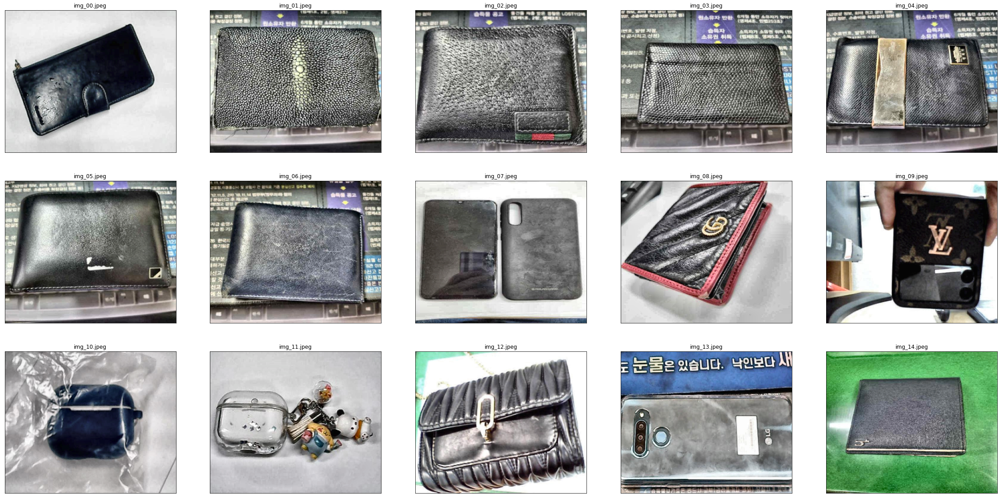

In [56]:
show_adhist(2.0)

# Color Quantization usin K-Means

In [57]:
from sklearn.cluster import KMeans

In [58]:
def k_means(img, n_colors= 4):
    w, h, d = original_shape = tuple(img.shape)
    img= img/255.0
    image_array = np.reshape(img, (w * h, d))
    kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array)
    labels = kmeans.predict(image_array)

    """Recreate the (compressed) image from the code book & labels"""
    codebook= kmeans.cluster_centers_
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

In [59]:
def show_kmean(n_colors=4):
    f, ax = plt.subplots(3, 5, figsize=(40,20))
    for i in tqdm(range(15)):
        path= os.path.join('./sample_data', file_list[i])
        img_id= file_list[i]
        img=load(path, 300)
        img= k_means(img , n_colors= n_colors)
        ax[i//5][i%5].imshow(img, aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()

100%|██████████| 15/15 [00:07<00:00,  1.88it/s]


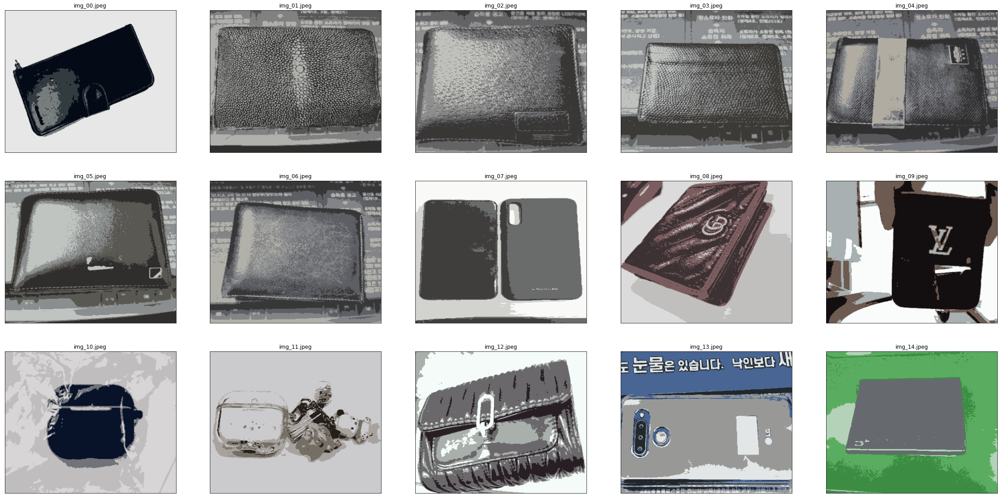

In [60]:
show_kmean(n_colors= 4)

# Edge detection with required Morphological Transformations

In [61]:
def show_edges(n_colors=4):
    f, ax = plt.subplots(3, 5, figsize=(40,20))
    for i in tqdm(range(15)):
        path= os.path.join('./sample_data', file_list[i])
        img_id= file_list[i]
        img=load(path, 300)
        img= k_means(img , n_colors= n_colors)

        img_gray= cv2.cvtColor(np.uint8(img*255), cv2.COLOR_RGB2GRAY)
        img_gray= cv2.medianBlur(img_gray,5)
        edges = cv2.Canny(img_gray,100,200)
        ax[i//5][i%5].imshow(edges, aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()

100%|██████████| 15/15 [00:05<00:00,  2.59it/s]


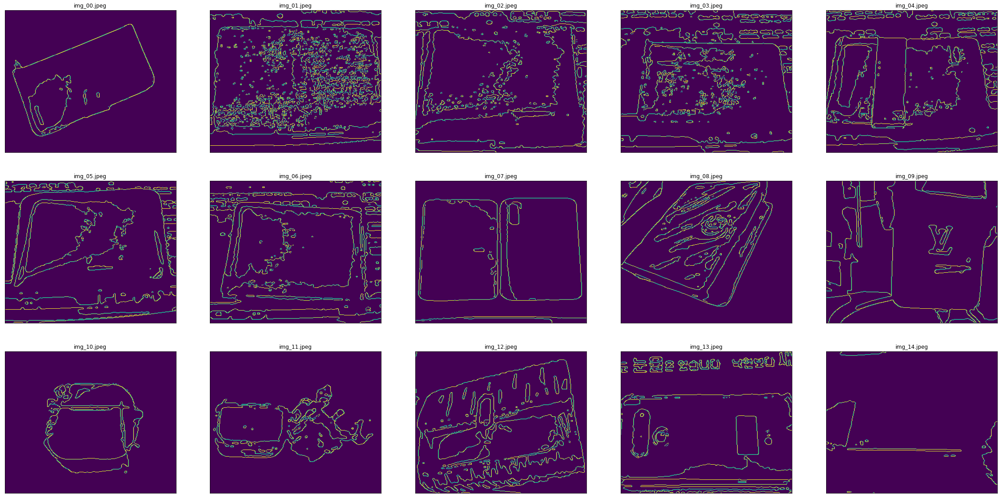

In [62]:
show_edges(n_colors =3)

# Object detection(Drawing bounding boxes around target)

In [63]:
def find_box(edges):
    #contour masking
    co, hi = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    con=max(co,key=cv2.contourArea)
    conv_hull=cv2.convexHull(con)

    top=tuple(conv_hull[conv_hull[:,:,1].argmin()][0])
    bottom=tuple(conv_hull[conv_hull[:,:,1].argmax()][0])
    left=tuple(conv_hull[conv_hull[:,:,0].argmin()][0])
    right=tuple(conv_hull[conv_hull[:,:,0].argmax()][0])

    return top, bottom, left, right

In [64]:
def draw_bound_box():
    f, ax = plt.subplots(3, 5, figsize=(40,20))
    for i in tqdm(range(15)):
        path= os.path.join('./sample_data', file_list[i])
        img_id= file_list[i]
        img=load(path, 224)
        org=img.copy()
        img= k_means(img , n_colors= 10)

        img_gray= cv2.cvtColor(np.uint8(img*255), cv2.COLOR_RGB2GRAY)
        img_gray= cv2.medianBlur(img_gray,7)
        edges = cv2.Canny(img_gray,100,200)

        kernel= cv2.getStructuringElement(cv2.MORPH_RECT,(15,15))
        edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

        top,bottom,left,right = find_box(edges)
        org=cv2.rectangle(org, (left[0], top[1]), (right[0], bottom[1]), (0, 255, 0), thickness=3)

        ax[i//5][i%5].imshow(org, aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()

100%|██████████| 15/15 [00:10<00:00,  1.37it/s]


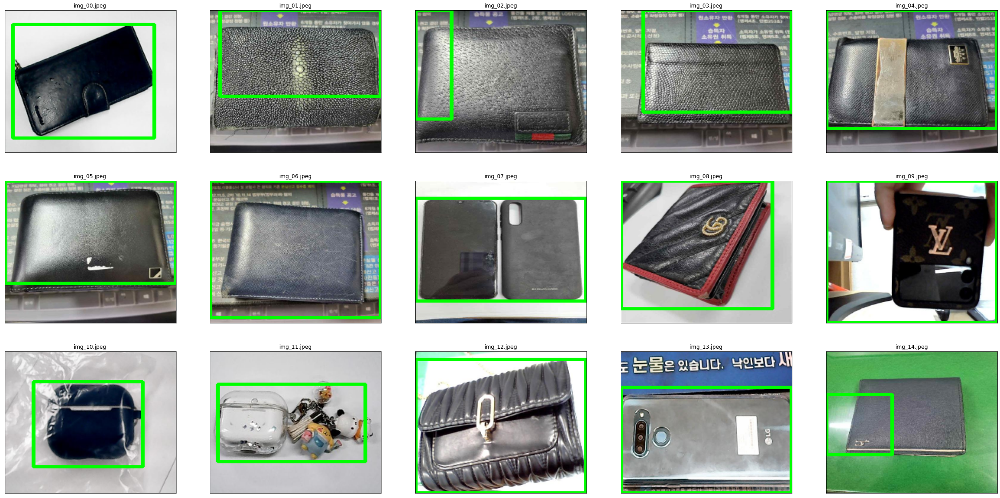

In [65]:
draw_bound_box()

# Foreground extraction

In [66]:
def forgrd_ext(img, rec):
    mask= np.zeros(img.shape[:2], np.uint8)
    bgmodel= np.zeros((1, 65), np.float64)
    fgmodel= np.zeros((1, 65), np.float64)
    cv2.grabCut(img, mask, rec, bgmodel, fgmodel, 3, cv2.GC_INIT_WITH_RECT)
    mask2= np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
    img= img*mask2[:,:,np.newaxis]
    img[np.where((img == [0,0,0]).all(axis = 2))] = [255.0, 255.0, 255.0]
    return img

def ext_frgd():
    f, ax = plt.subplots(3, 5, figsize=(40,30))
    for i in tqdm(range(15)):
        path= os.path.join('./sample_data', file_list[i])
        img_id= file_list[i]
        img=load(path, 224)
        org=img.copy()
        img= k_means(img , n_colors= 10)

        img_gray= cv2.cvtColor(np.uint8(img*255), cv2.COLOR_RGB2GRAY)
        img_gray= cv2.medianBlur(img_gray,7)
        edges = cv2.Canny(img_gray,100,200)

        kernel= cv2.getStructuringElement(cv2.MORPH_RECT,(15,15))
        edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

        top,bottom,left,right = find_box(edges)
        rec= (left[0], top[1], right[0]-left[0], bottom[1]-top[1])
        forground_img= forgrd_ext(org, rec)

        ax[i//5][i%5].imshow(forground_img, aspect='auto')
        ax[i//5][i%5].set_title(img_id)
        ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    plt.show()

100%|██████████| 15/15 [00:14<00:00,  1.02it/s]


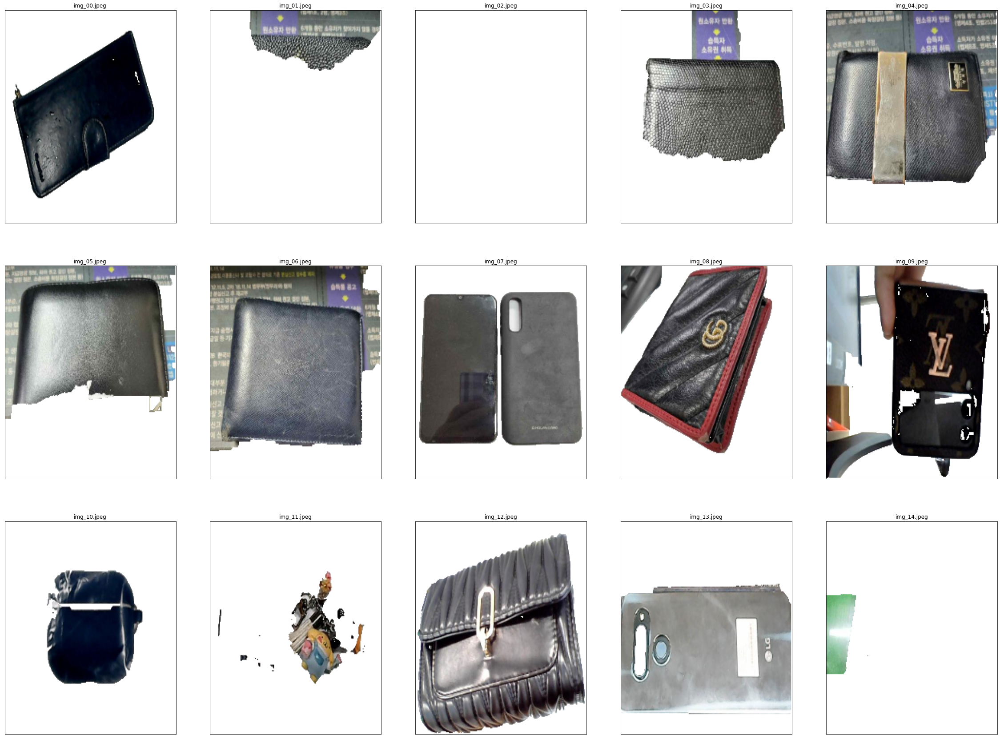

In [67]:
ext_frgd()

In [68]:
path= os.path.join('./sample_data', file_list[7])
im1= load(path, 300)

im2= img= k_means(im1 , n_colors= 3)

im3= cv2.cvtColor(np.uint8(im2*255), cv2.COLOR_RGB2GRAY)
im3= cv2.medianBlur(im3,5)
im3 = cv2.Canny(im3,100,200)
kernel= cv2.getStructuringElement(cv2.MORPH_RECT,(15,15))
im31 = cv2.morphologyEx(im3, cv2.MORPH_CLOSE, kernel)

top,bottom,left,right = find_box(im31)
im4=cv2.rectangle(im1.copy(), (left[0], top[1]), (right[0], bottom[1]), (0, 255, 0), thickness=3)

rec= (left[0], top[1], right[0]-left[0], bottom[1]-top[1])
im5= forgrd_ext(im1, rec)